이번 시간에서는 TOP solution에서는 어떠한 trick을 사용하였는지 알아보도록 하겠습니다. 
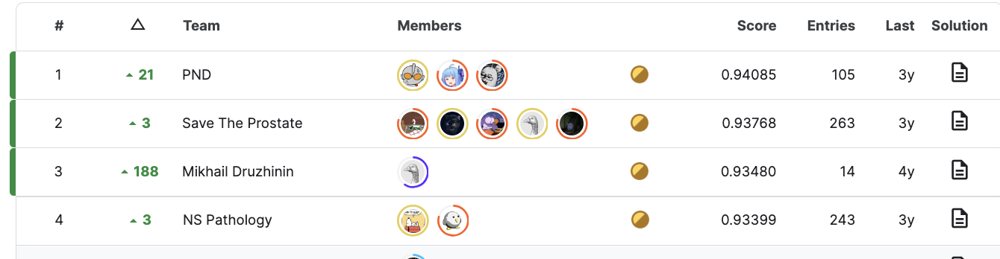



이번시간에서는 이 challenge에 참석한 다른 사람들은 어떠한 방법을 가지고 순위에 들었는지에 대해서 살펴보도록 하겠습니다. 

Kaggle에서 Sliver나 Gold 메달을 얻는건 시간과 많은 기술들이 들어가게 되어지는데요 이러한 사용했던 기수들을 서로 공유하는 상황이 많습니다. 

우리는 엔지니어적으로 모델을 기술을 향상시키기 위해서는 많은 방법들이 사용이 될텐데요 이번시간에서는 이러한 방법들중 상위권에 있으신 분들의 성능을 살펴보도록 하겠습니다. 

TOP solution link

* 1st : https://www.kaggle.com/competitions/prostate-cancer-grade-assessment/discussion/169143
* 2st : https://www.kaggle.com/competitions/prostate-cancer-grade-assessment/discussion/169108
* 3st : https://www.kaggle.com/competitions/prostate-cancer-grade-assessment/discussion/169232
* 4st : https://www.kaggle.com/competitions/prostate-cancer-grade-assessment/discussion/169113

# 1st Solution

첫번째로 살펴 볼 분은요 kaggle 1등을 하셨던 분인데요 이 분의 경우 kappa score 0.941로 높은 성능을 달성했습니다. 

1. `**Split kfold with image similarity**`
2. Training with original label (with noise)
3. `**Remove noise by prediction and original label gap(out of fold)**`
4. Re-train model without noise
5. `**Ensemble**`


## Get image similiarity

이 분의 링크로 들어가면 많은 ㅣ기술들이 적혀 있는데요 
Solution은 image similiarity가 유사한 분들끼리 나누는 작업을 먼저하였습니다. 
이를 통해서 같은 이미지간의 kfold로 나누는 작업을 하였습니다. 
그러한후 noise label즉 일반적인 학습을 한후에 prediction으로 noise를 제거 하였습니다. 
그후에 다시 재 학습을 하였는데요 

Noise를 제거하는 방법은 다음과 같았습니다. 
간단하지만 효과적인 방법을 사용하여서 모델에서 예측한 데이터가 크게 차이가 나는 경우 잘못된 레이블이거나 어려운 데이터로 생각을 하게 됩니다. 
그렇기 때문에 많은 실험을 하면서 평균적으로 GAP차이가 적게 나는 을 기준으로 데이터를 제거 했었는데요 예측과의 GAP차이가 적게 나는 바업ㅂ만 살렸다고 보시면 될것같습니다. 

그결과 20% 데이터가 줄었다고 말을 하고 있습니다. 노이즈를 줄이는 것만으로 성능이 올라간것을 볼 수 있었습니다. 

그렇다면 모델은 어떻게 할까요? 


In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os

# Use Lopuhin's dataset for faster image loading.
# https://www.kaggle.com/lopuhin/panda-2020-level-1-2

import glob
from pathlib import Path

paths = sorted(glob.glob('../input/panda-2020-level-1-2/train_images/train_images/*_2.jpeg'))
print(len(paths))

imgids = [Path(p).stem.split('_')[0] for p in paths]

print(len(imgids))
print(len(set(imgids)))

import torch

10616
10616
10616


In [3]:
# Use only 4000 images for demonstration.

# paths = paths[:4000]

# Here comes imagehash
# https://github.com/JohannesBuchner/imagehash

import cv2
import imagehash
from tqdm import tqdm_notebook as tqdm
from PIL import Image

funcs = [
    imagehash.average_hash,
    imagehash.phash,
    imagehash.dhash,
    imagehash.whash,
    #lambda x: imagehash.whash(x, mode='db4'),
]

hashes = []


In [ ]:

for path in tqdm(paths, total=len(paths)):
    image = cv2.imread(path)
    image = Image.fromarray(image)
    hashes.append(np.array([f(image).hash for f in funcs]).reshape(256))

In [ ]:
# use cuda to speed up
hashes = torch.Tensor(np.array(hashes).astype(int))

# calc similarity scores
sims = np.array([(hashes[i] == hashes).sum(dim=1).cpu().numpy()/256 for i in range(hashes.shape[0])])

In [4]:
sims2 = sims.copy()
np.fill_diagonal(sims2, 0)

threshold = 0.90
duplicates = np.where(sims2 > threshold)
# duplicates = np.where((sims2 > threshold))  (sims2 < (threshold + 0.1))
print(len(duplicates[0]))

3684


../input/panda-2020-level-1-2/train_images/train_images/004391d48d58b18156f811087cd38abf_2.jpeg
../input/panda-2020-level-1-2/train_images/train_images/33e5c5adbc6e45de43d219d96f244f3b_2.jpeg
0.90234375


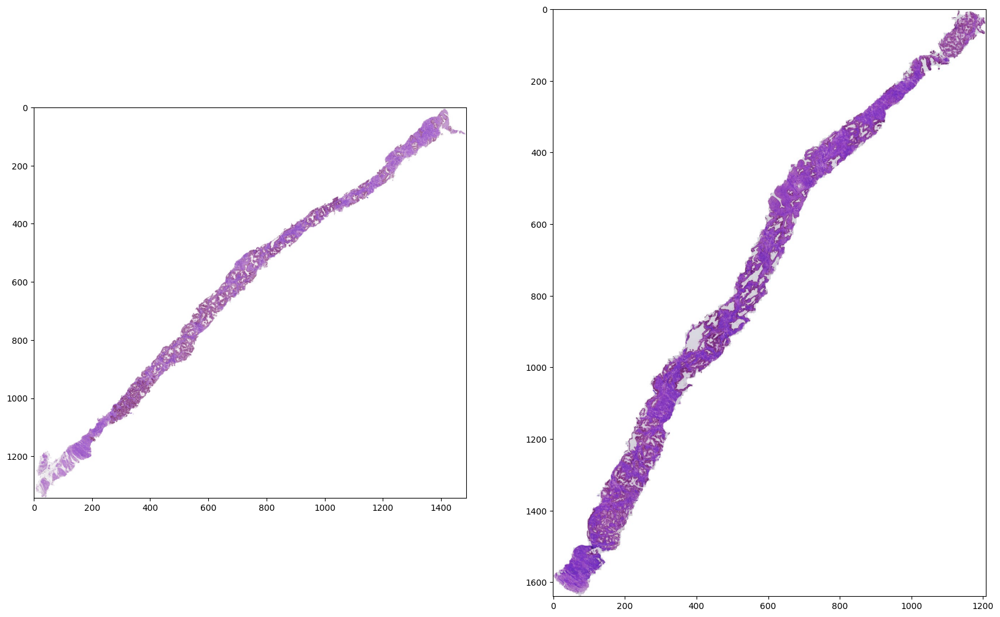

../input/panda-2020-level-1-2/train_images/train_images/004391d48d58b18156f811087cd38abf_2.jpeg
../input/panda-2020-level-1-2/train_images/train_images/37b0ce91b7bdaf3100aae1748009424e_2.jpeg
0.90625


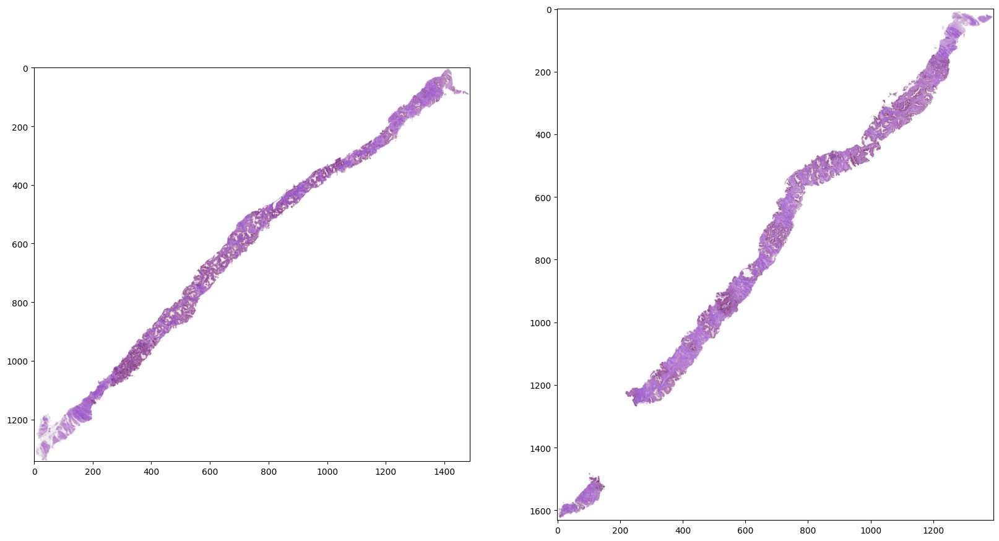

../input/panda-2020-level-1-2/train_images/train_images/004391d48d58b18156f811087cd38abf_2.jpeg
../input/panda-2020-level-1-2/train_images/train_images/7f8cb9cdc9c8f069cec25c44ab4210de_2.jpeg
0.921875


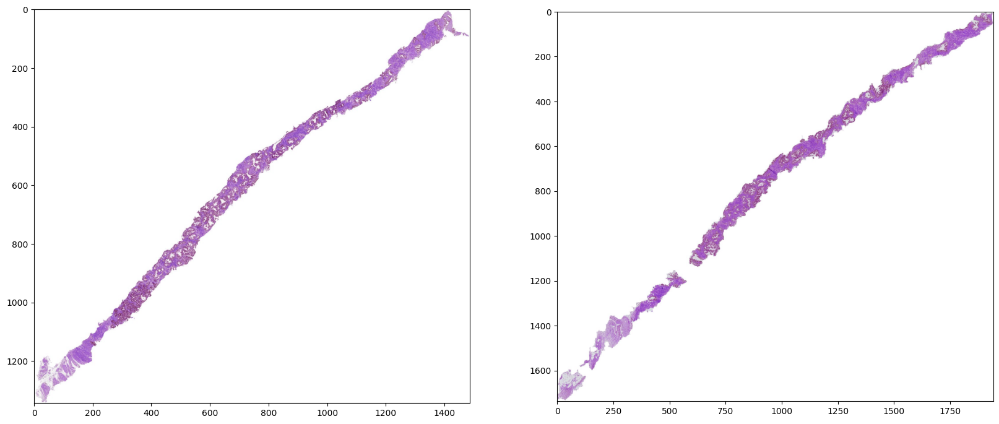

../input/panda-2020-level-1-2/train_images/train_images/004391d48d58b18156f811087cd38abf_2.jpeg
../input/panda-2020-level-1-2/train_images/train_images/830484a95f45f28e37b68bd440fd9357_2.jpeg
0.91796875


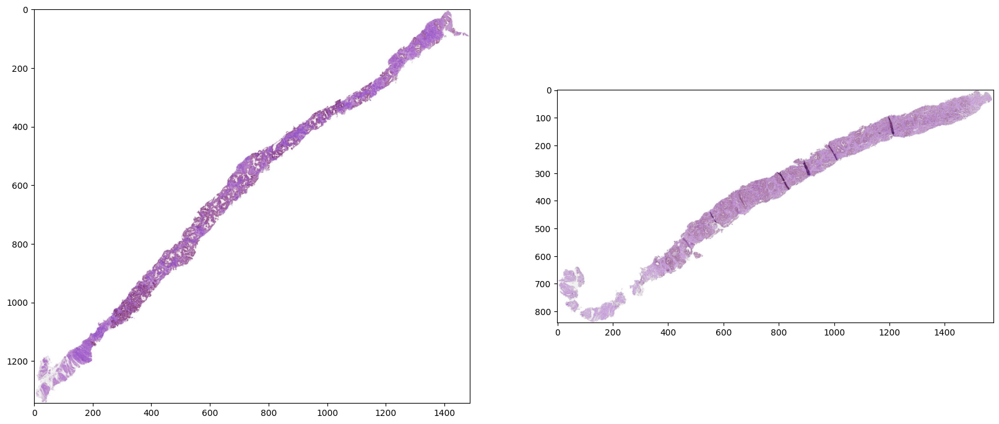

../input/panda-2020-level-1-2/train_images/train_images/004391d48d58b18156f811087cd38abf_2.jpeg
../input/panda-2020-level-1-2/train_images/train_images/84c2a5a9252e223ab8e84010b685dc11_2.jpeg
0.90625


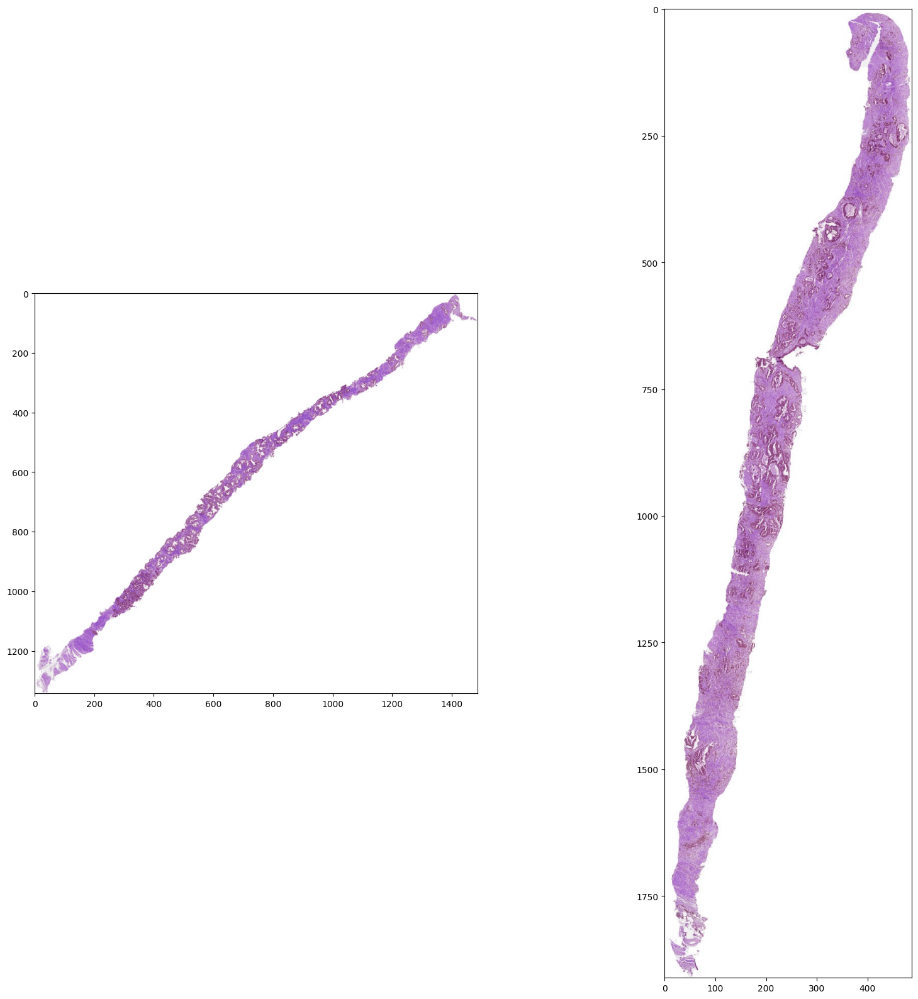

../input/panda-2020-level-1-2/train_images/train_images/004391d48d58b18156f811087cd38abf_2.jpeg
../input/panda-2020-level-1-2/train_images/train_images/964eaa4f691fa26ef2b0f6ad487510d8_2.jpeg
0.921875


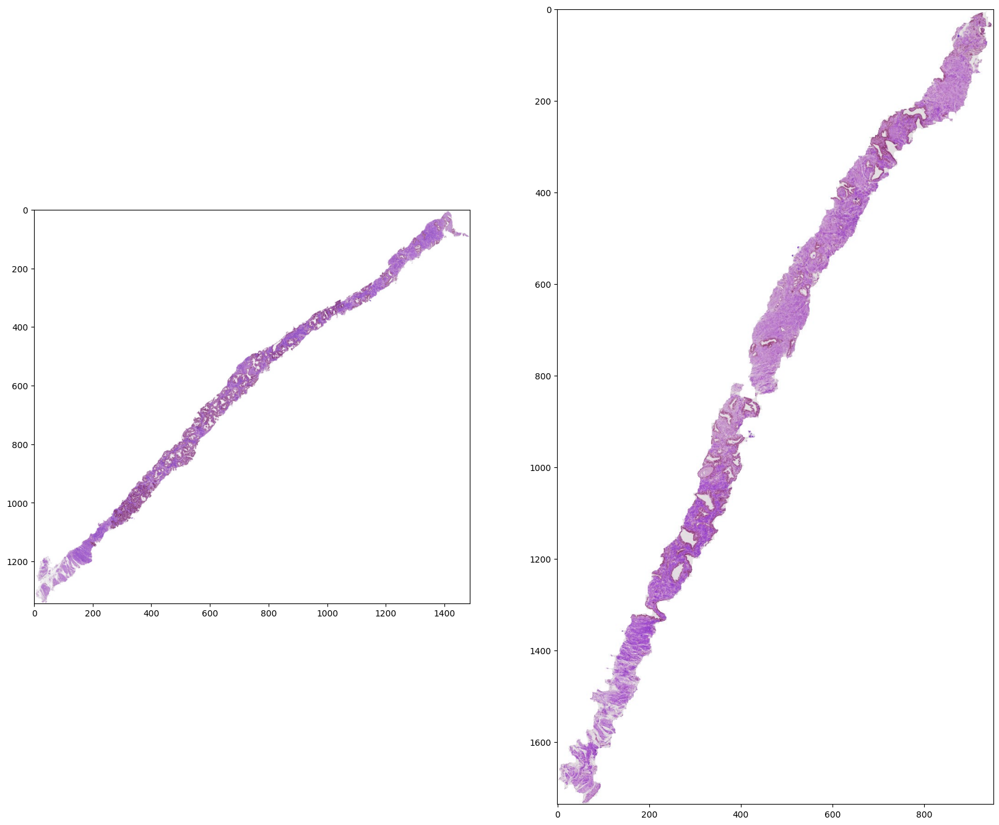

../input/panda-2020-level-1-2/train_images/train_images/004391d48d58b18156f811087cd38abf_2.jpeg
../input/panda-2020-level-1-2/train_images/train_images/c321dc296ee2274e9db04e586c7aabf2_2.jpeg
0.91015625


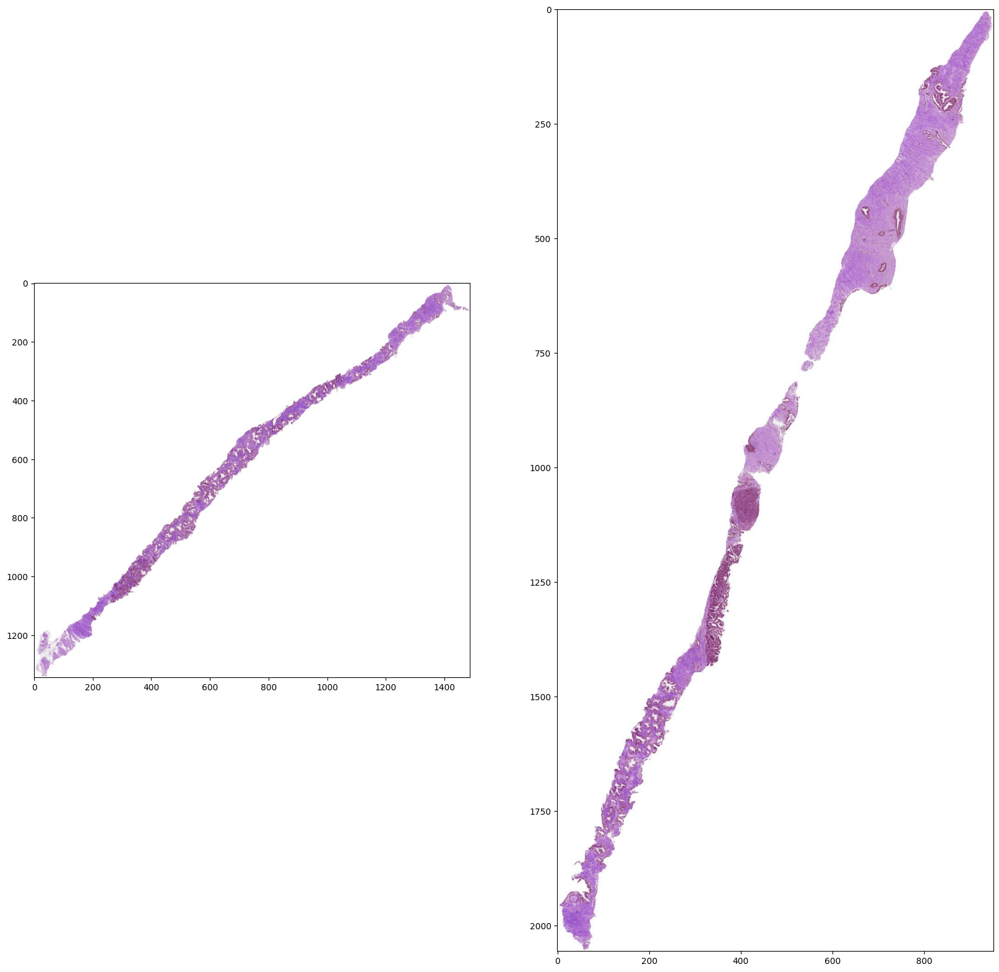

../input/panda-2020-level-1-2/train_images/train_images/004391d48d58b18156f811087cd38abf_2.jpeg
../input/panda-2020-level-1-2/train_images/train_images/d82ed201dc437809e5fb20877310bedc_2.jpeg
0.94921875


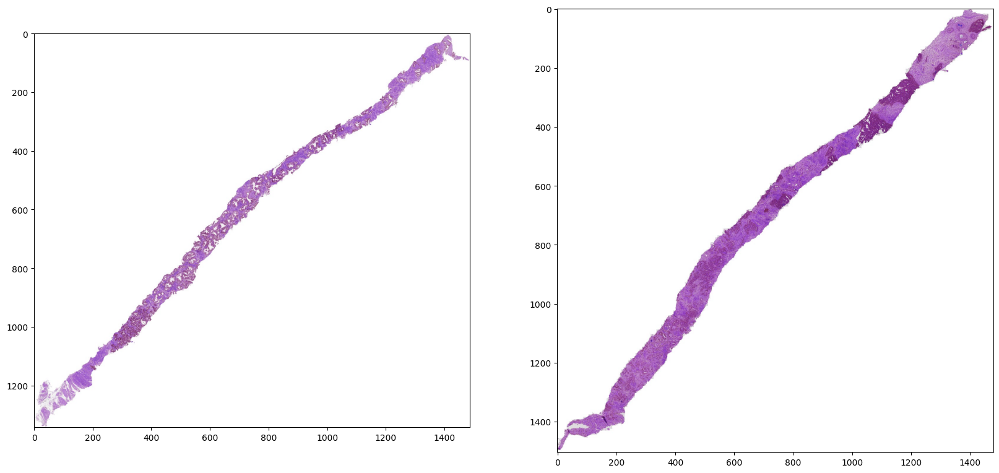

../input/panda-2020-level-1-2/train_images/train_images/004dd32d9cd167d9cc31c13b704498af_2.jpeg
../input/panda-2020-level-1-2/train_images/train_images/bd5aa0e284c6dc0b0b09513731f252a8_2.jpeg
0.96484375


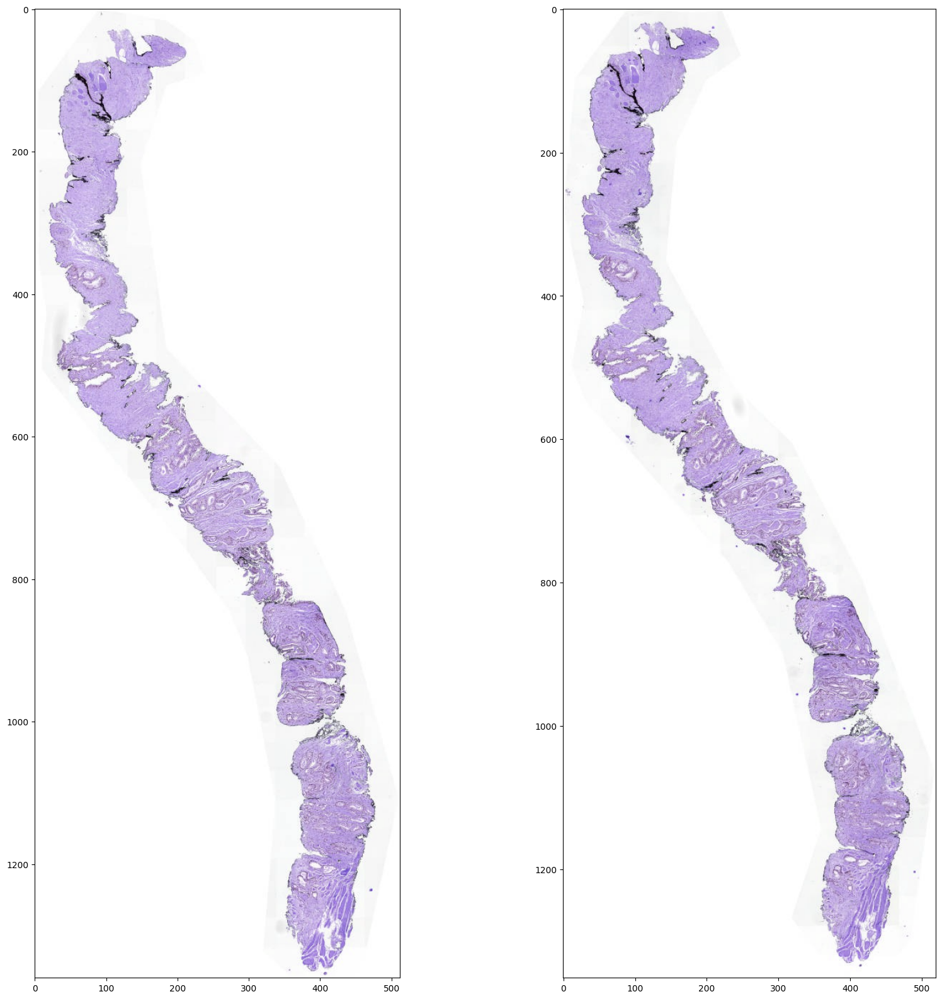

../input/panda-2020-level-1-2/train_images/train_images/00928370e2dfeb8a507667ef1d4efcbb_2.jpeg
../input/panda-2020-level-1-2/train_images/train_images/8a31a42bb904f022190f57733ccef19c_2.jpeg
0.9453125


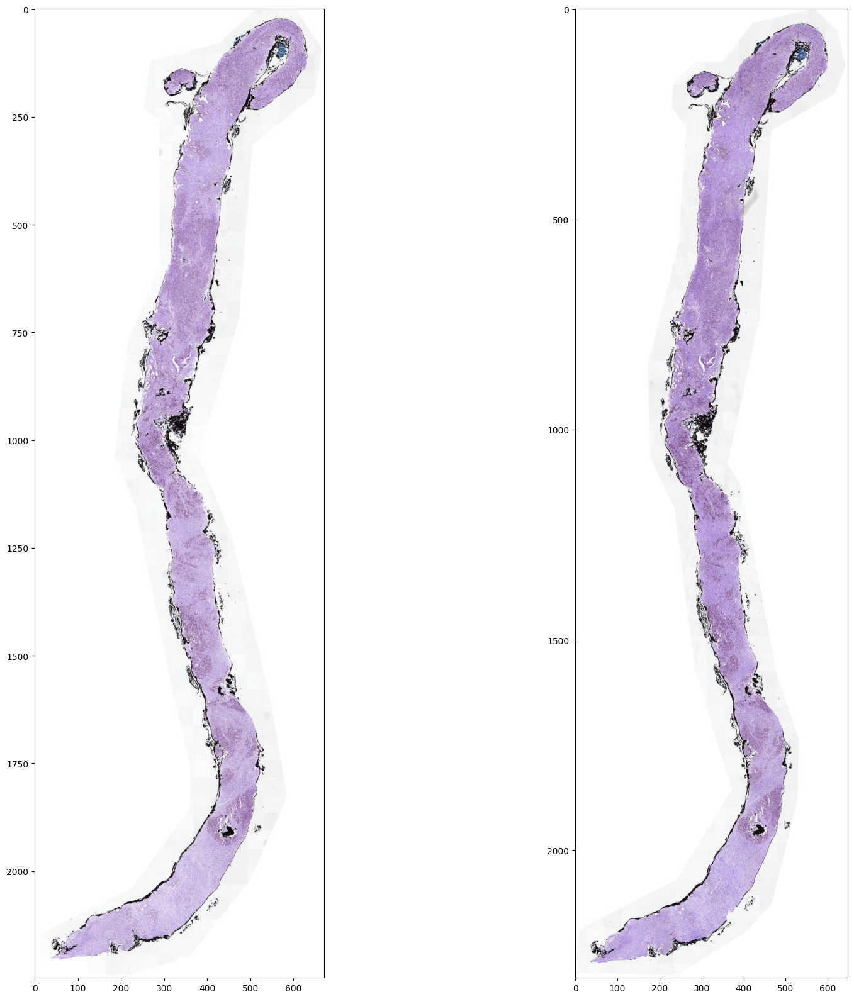

../input/panda-2020-level-1-2/train_images/train_images/00bbc1482301d16de3ff63238cfd0b34_2.jpeg
../input/panda-2020-level-1-2/train_images/train_images/771b4d1f002ddd740017d6e4371df8d0_2.jpeg
0.9453125


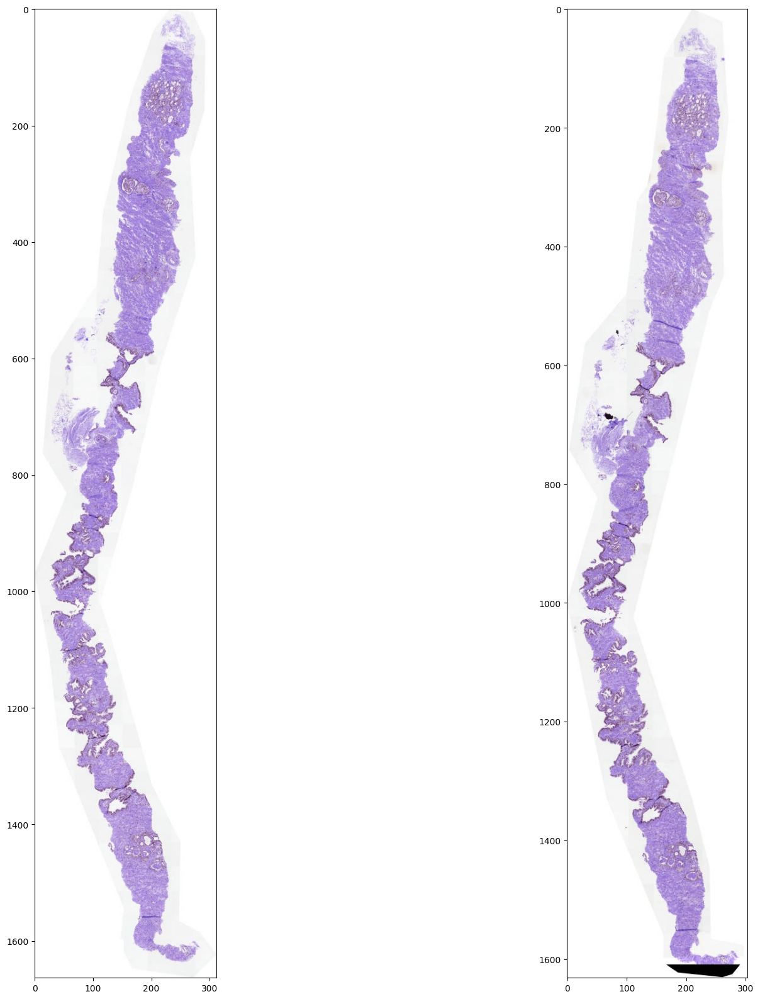

../input/panda-2020-level-1-2/train_images/train_images/00c15b23b30a5ba061358d9641118904_2.jpeg
../input/panda-2020-level-1-2/train_images/train_images/8826e4b9c231e9b9a69a5f2e8efc815a_2.jpeg
0.94140625


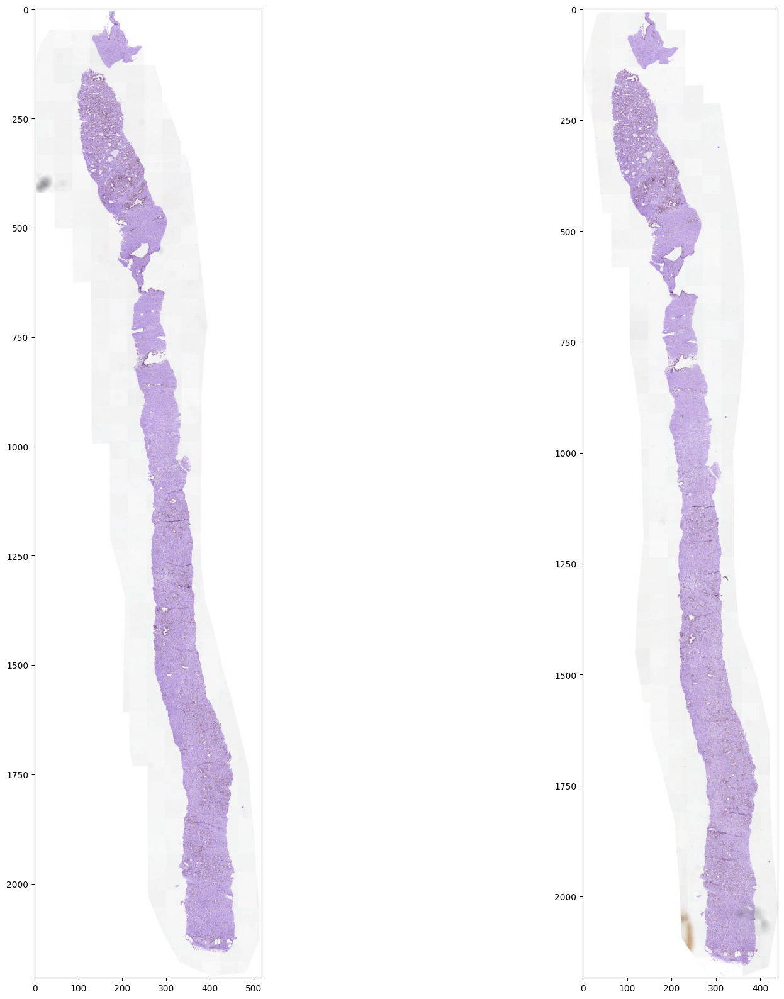

../input/panda-2020-level-1-2/train_images/train_images/00c46b336b5b06423fcdec1b4d5bee06_2.jpeg
../input/panda-2020-level-1-2/train_images/train_images/7bb9269813e03e9e784a87f3a2486f04_2.jpeg
0.94921875


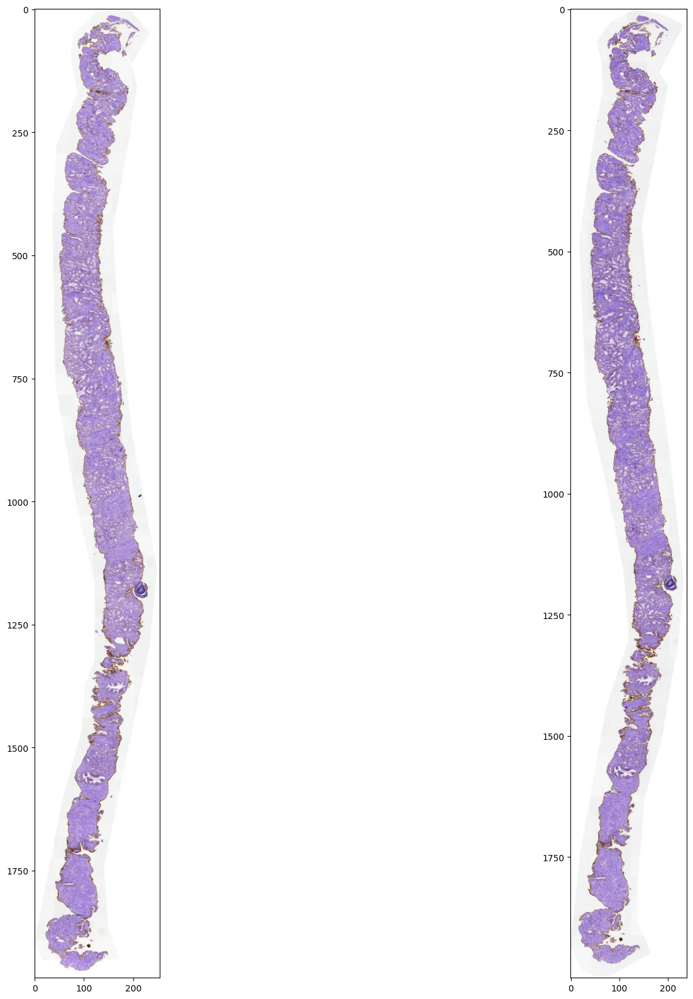

../input/panda-2020-level-1-2/train_images/train_images/00c52cb4db1c7a5811a8f070a910c038_2.jpeg
../input/panda-2020-level-1-2/train_images/train_images/05657a4cdbbe3bd466402d227bf0b2c7_2.jpeg
0.90625


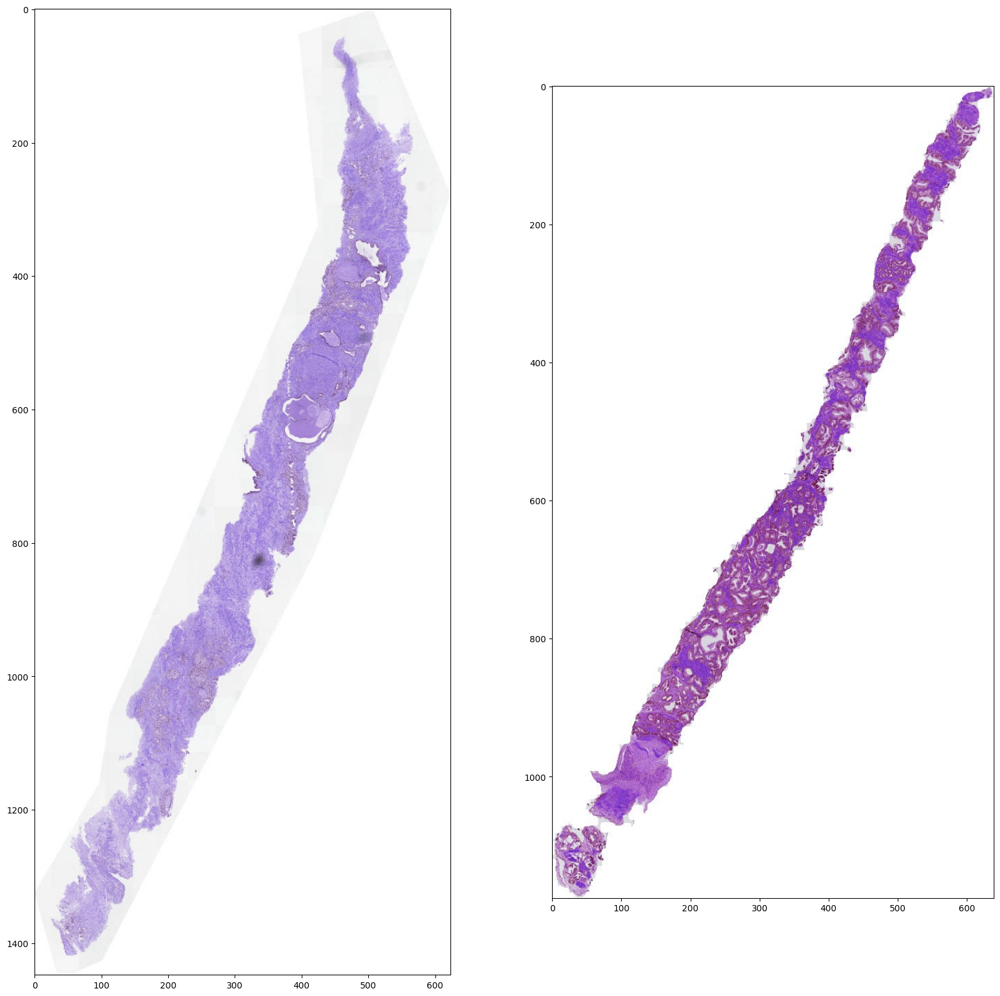

../input/panda-2020-level-1-2/train_images/train_images/00c52cb4db1c7a5811a8f070a910c038_2.jpeg
../input/panda-2020-level-1-2/train_images/train_images/55ef26c752d337b792969f498c5cb45f_2.jpeg
0.90234375


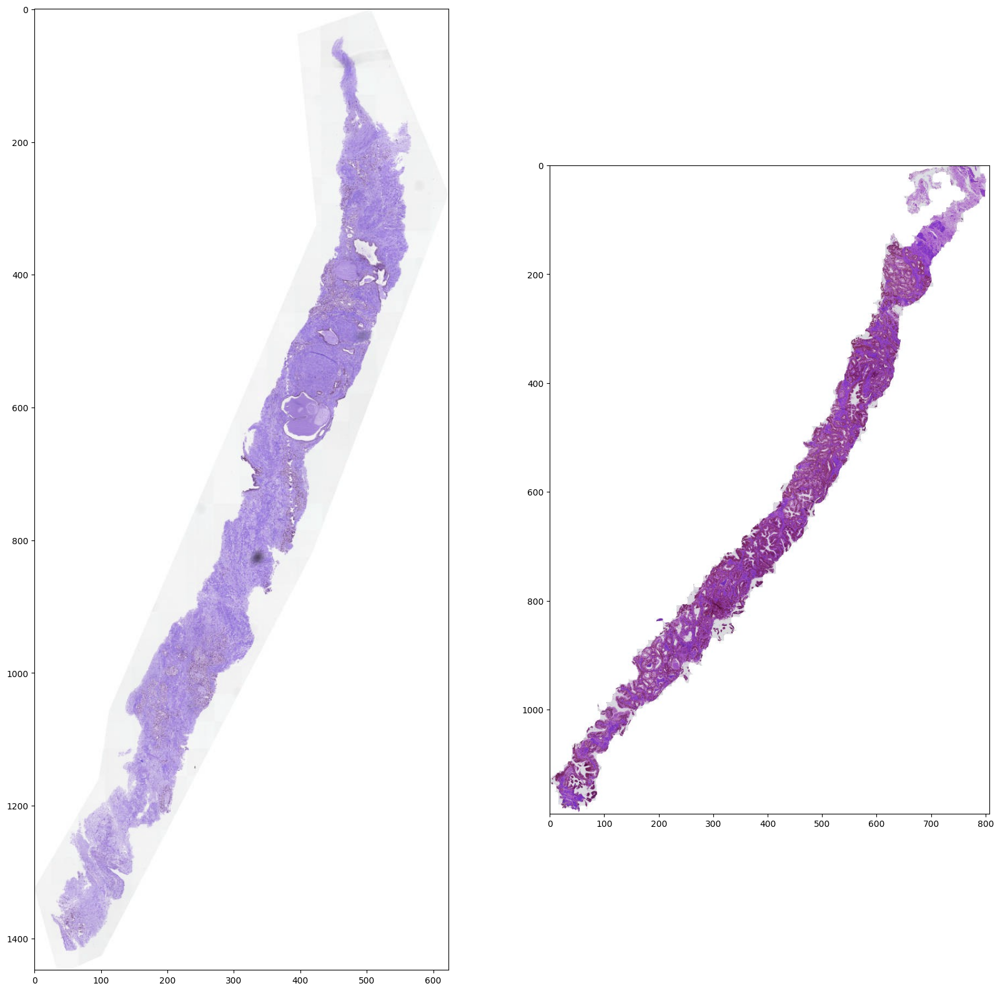

../input/panda-2020-level-1-2/train_images/train_images/00c52cb4db1c7a5811a8f070a910c038_2.jpeg
../input/panda-2020-level-1-2/train_images/train_images/75e041fb7c1d1188888c2010c856095b_2.jpeg
0.9140625


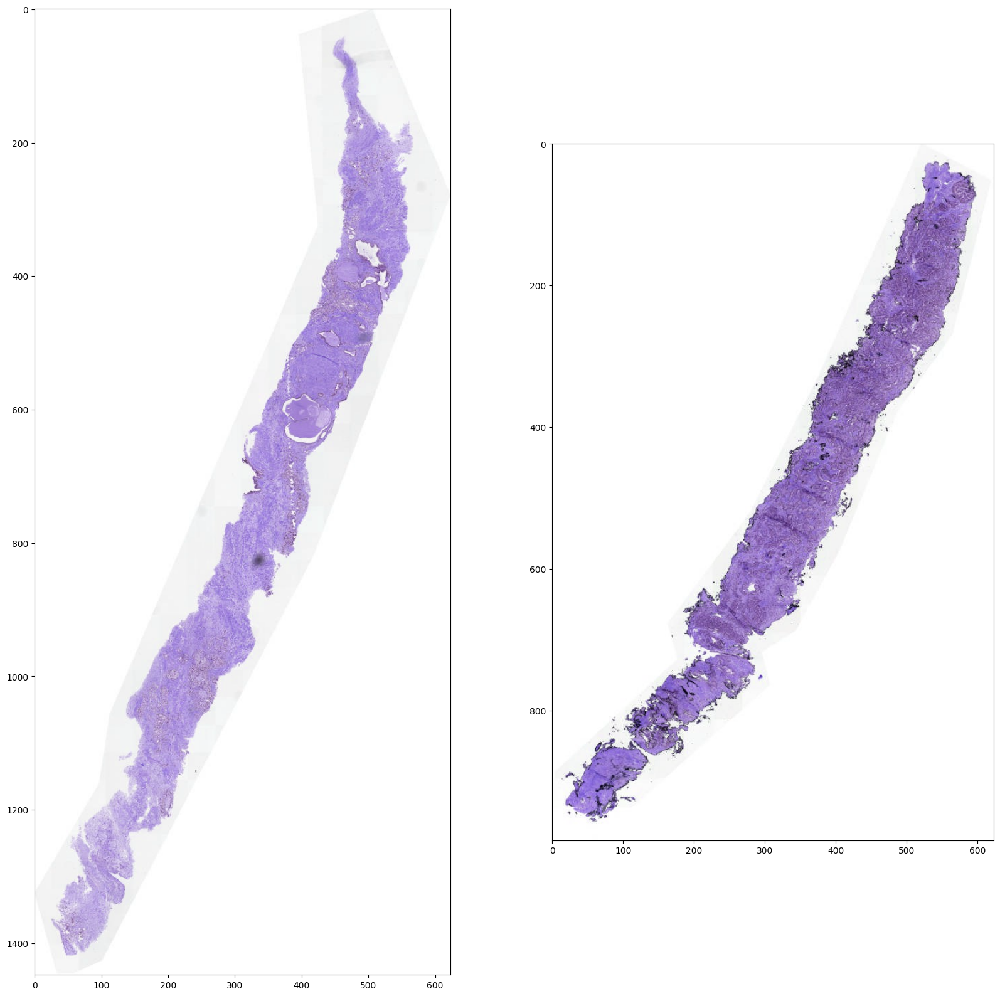

../input/panda-2020-level-1-2/train_images/train_images/00c52cb4db1c7a5811a8f070a910c038_2.jpeg
../input/panda-2020-level-1-2/train_images/train_images/98ad56445792bbc98832ffa0e4f821fb_2.jpeg
0.90234375


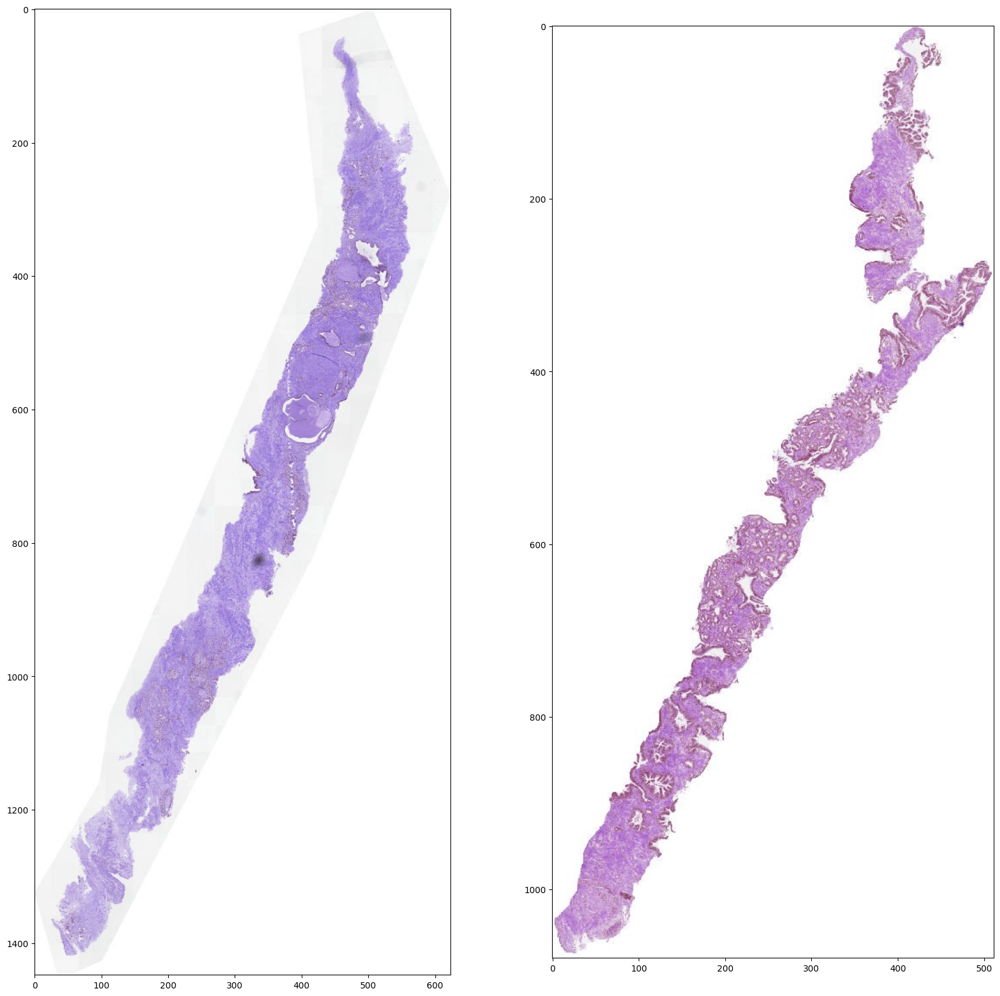

../input/panda-2020-level-1-2/train_images/train_images/00c52cb4db1c7a5811a8f070a910c038_2.jpeg
../input/panda-2020-level-1-2/train_images/train_images/99c6eb1d87928dfae4d098276b85b98c_2.jpeg
0.9453125


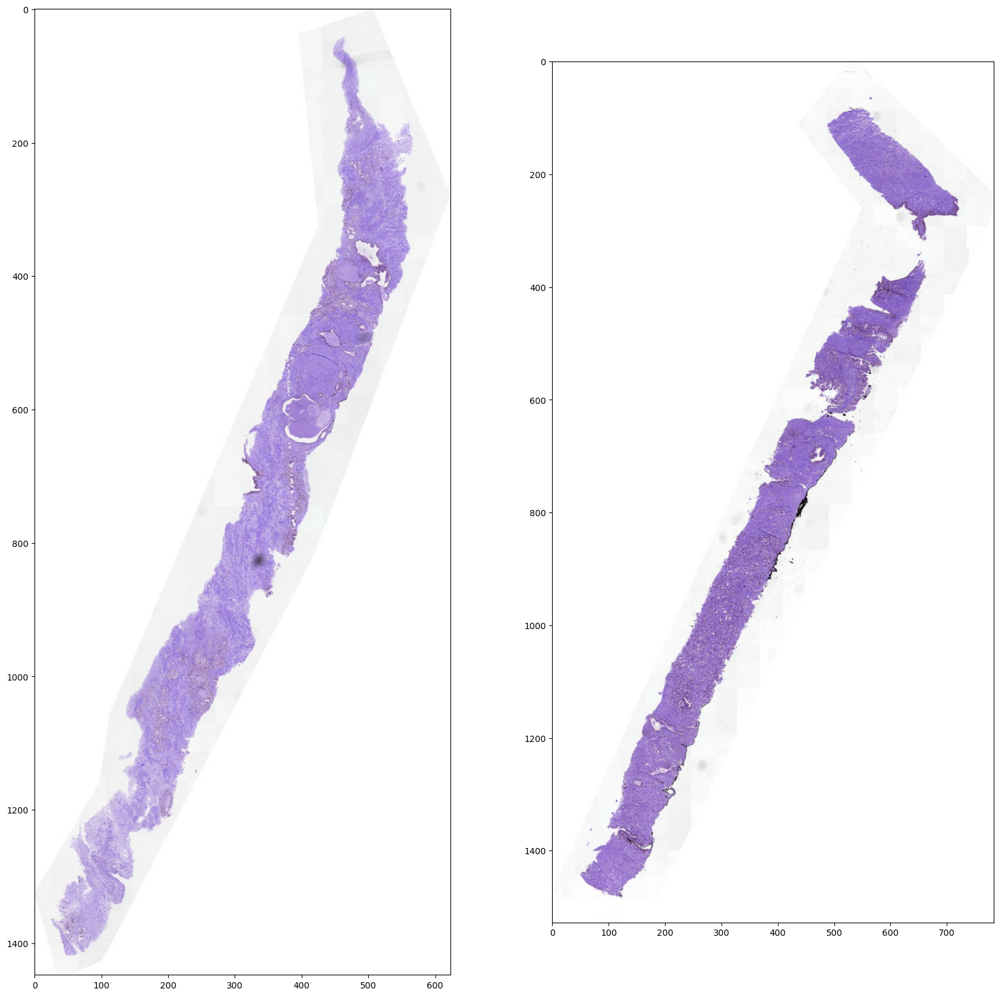

../input/panda-2020-level-1-2/train_images/train_images/00c52cb4db1c7a5811a8f070a910c038_2.jpeg
../input/panda-2020-level-1-2/train_images/train_images/b3852036b9bab5f90891f5f18617b559_2.jpeg
0.90234375


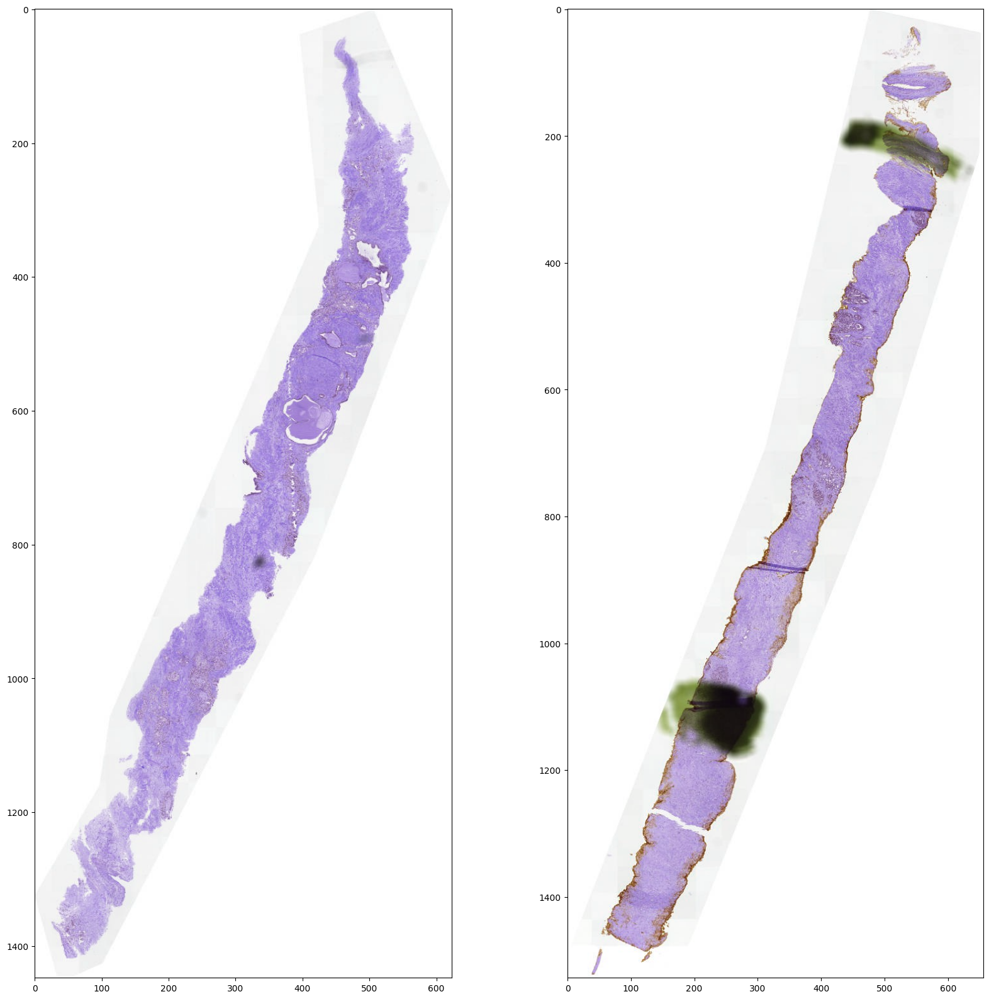

../input/panda-2020-level-1-2/train_images/train_images/00c52cb4db1c7a5811a8f070a910c038_2.jpeg
../input/panda-2020-level-1-2/train_images/train_images/b6f1c3c748055235a8130ee71f4d3efa_2.jpeg
0.91015625


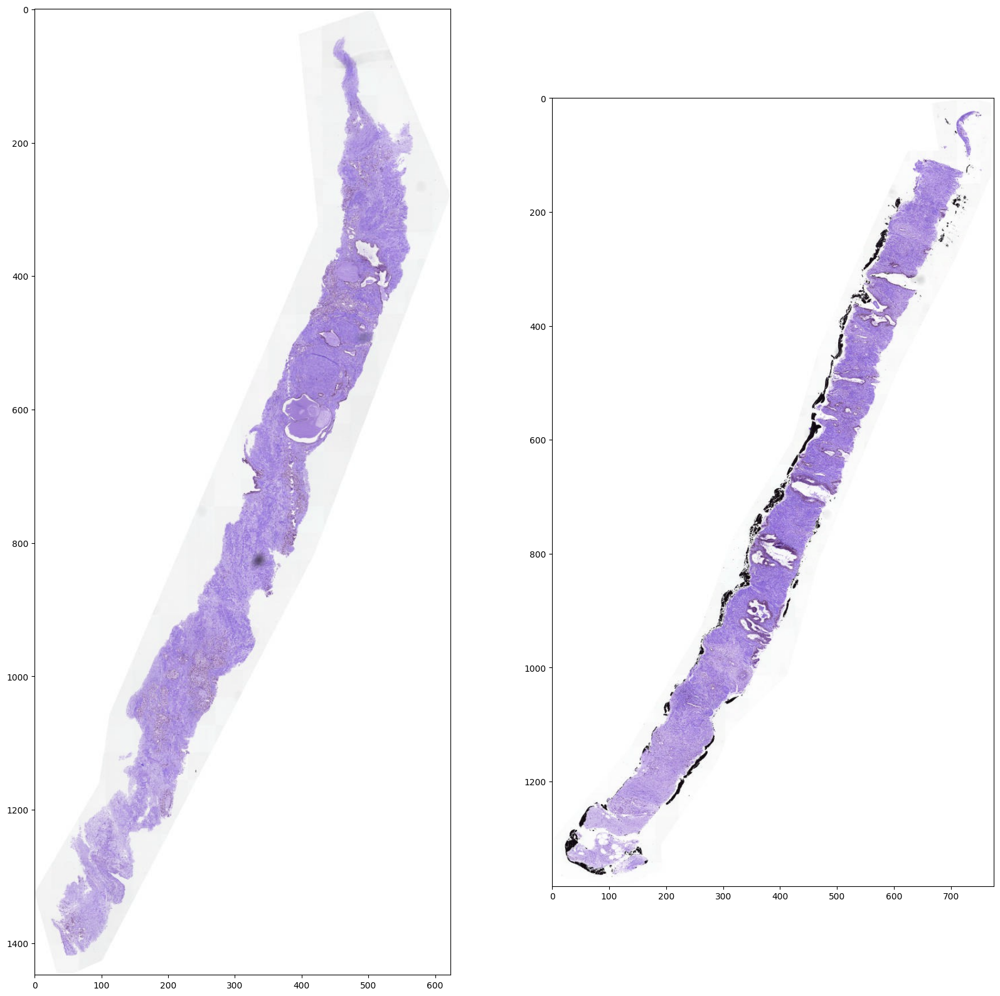

../input/panda-2020-level-1-2/train_images/train_images/00c52cb4db1c7a5811a8f070a910c038_2.jpeg
../input/panda-2020-level-1-2/train_images/train_images/b7932b71e15722e1908ad98af13d50fb_2.jpeg
0.93359375


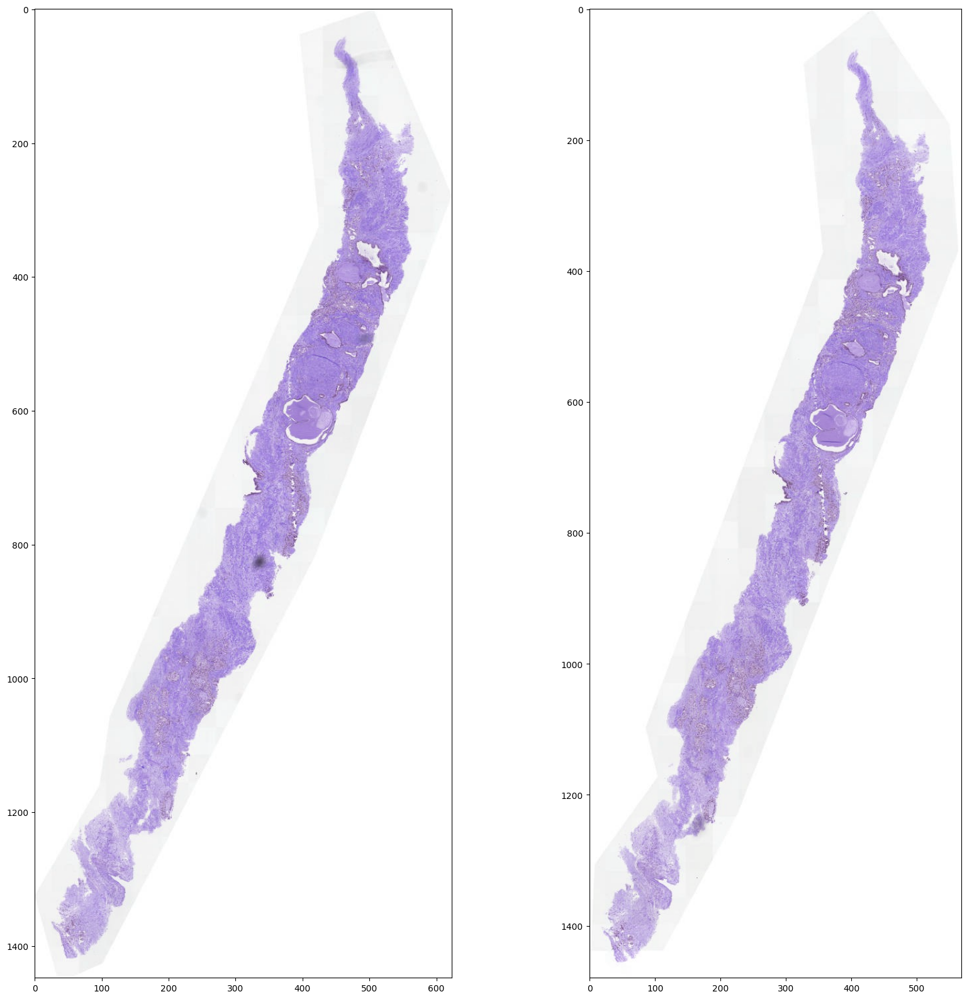

In [5]:
# Let's check image pairs with similarity larget than threshold.
# You can lower threshold to find more duplicates (and more false positives).

import matplotlib.pyplot as plt

count = 20
tmp = 0

pairs = {}
for i,j in zip(*duplicates):
    if i == j:
        continue

    path1 = paths[i]
    path2 = paths[j]
    print(path1)
    print(path2)
    print(sims2[i, j])

    image1 = cv2.imread(path1)
    image2 = cv2.imread(path2)

    if image1.shape[0] > image1.shape[1] / 2:
        fig,ax = plt.subplots(figsize=(20,20), ncols=2)
    elif image1.shape[1] > image1.shape[0] / 2:
        fig,ax = plt.subplots(figsize=(20,20), nrows=2)
    else:
        fig,ax = plt.subplots(figsize=(20,30), nrows=2)
    ax[0].imshow(image1)
    ax[1].imshow(image2)
    plt.show()
    
    tmp += 1
    if tmp > count:
        break

## Noise Training

In [6]:
# Base arutema method
def remove_noisy(df, thresh):
    gap = np.abs(df["isup_grade"] - df["probs_raw"])
    df_removed = df[gap > thresh].reset_index(drop=True)
    df_keep = df[gap <= thresh].reset_index(drop=True)
    return df_keep, df_removed

In [7]:
# loss
criterion = nn.BCEWithLogitsL`oss()
#

SyntaxError: invalid syntax (3126734898.py, line 2)

그렇다면 모델은 어떻게 할까요?   
모델의 경우 Patch로 잘라 학습을 하였으며 Loss의 경우 BCEloss를 사용하였다고 언급하고 있습니다.   
그 다음에는 3개의 모델을 만들어서 각각 다른 patch마다 평균을 하여 구하였다고 합니다.   
방법은 아래의 첨부된 그림에 있습니다.    

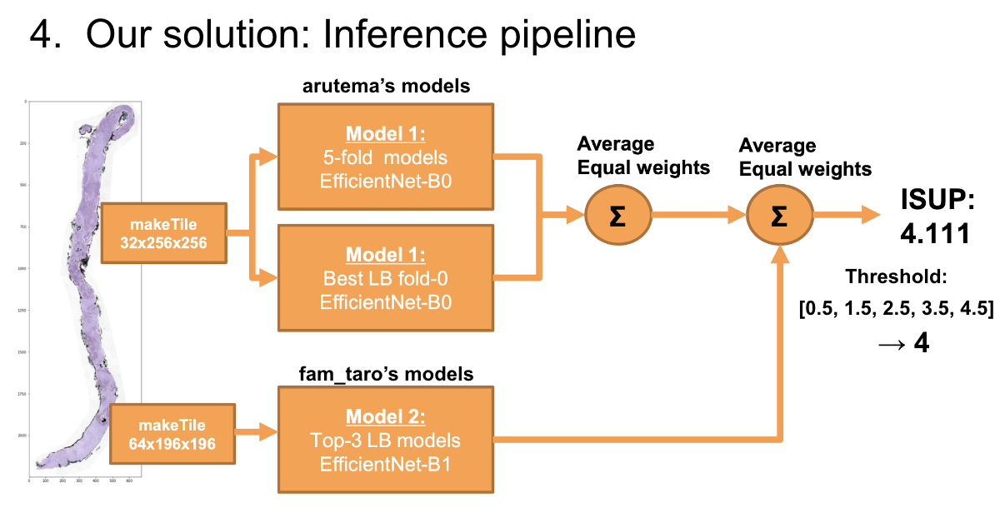
PPT Link : https://docs.google.com/presentation/d/1Ies4vnyVtW5U3XNDr_fom43ZJDIodu1SV6DSK8di6fs/edit#slide=id.g9b10629a30_0_327

# 2st Solution

* crop image whiting
* data의 noise한 Slide제거


In [9]:
#function taken from R Guo
def crop_white(image, value: int = 255):
    assert image.shape[2] == 3
    assert image.dtype == np.uint8
    ys, = (image.min((1, 2)) < value).nonzero()
    xs, = (image.min(0).min(1) < value).nonzero()
    if len(xs) == 0 or len(ys) == 0:
        return image
    return image[ys.min():ys.max() + 1, xs.min():xs.max() + 1]

In [10]:
# sample = cv2.imread('/kaggle/input/prostate-cancer-grade-assessment/train_images/0005f7aaab2800f6170c399693a96917.tiff')
sample = cv2.imread('/kaggle/input/panda-2020-level-1-2/train_images/train_images/0005f7aaab2800f6170c399693a96917_2.jpeg')

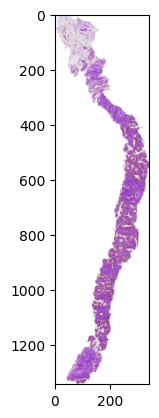

In [11]:
import matplotlib.pyplot as plt
plt.imshow(sample)

In [ ]:
blank_slides = ["3790f55cad63053e956fb73027179707"]
blank_masks = ["4a2ca53f240932e46eaf8959cb3f490a", "3790f55cad63053e956fb73027179707", 
"e4215cfc8c41ec04a55431cc413688a9", 
"aaa5732cd49bffddf0d2b7d36fbb0a83"]
low_tiss_slides = ['033e39459301e97e457232780a314ab7',
 '0b6e34bf65ee0810c1a4bf702b667c88',
 '3385a0f7f4f3e7e7b380325582b115c9',
 '3790f55cad63053e956fb73027179707',
 '5204134e82ce75b1109cc1913d81abc6',
 'a08e24cff451d628df797efc4343e13c']

In [ ]:
def get_transforms_train():
    transforms=A.Compose(
        [
            A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.05, rotate_limit=10, border_mode=cv2.BORDER_CONSTANT, p=0.5,value=(255,255,255)),
            A.OneOf([
                A.Flip(p=0.5),
                A.RandomRotate90(p=0.5),
            ], p=0.3
            )
        ]
    )
    return transforms

## 3st

github : https://github.com/Dipet/kaggle_panda/blob/master/train-efficientnet-b0-w-36-tiles-256-lb0-87/train-efficientnet-b0-w-36-tiles-256-lb0-87.py

## 4st

앙상블을 진행 
* efficientnet_b5 x 4
* seresnext101-64x4d x2
* seresnext101-32x4d x2
* resnest101e x2
* gem+efficientnet-b3 x 1

In [ ]:
import os
import cv2
import PIL
import random
import openslide
import skimage.io
import matplotlib
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import Image, display

train_df = pd.read_csv('../input/prostate-cancer-grade-assessment/train.csv').sample(n=100, random_state=0).reset_index(drop=True)

images = list(train_df['image_id'])
labels = list(train_df['isup_grade'])
data_dir = '../input/prostate-cancer-grade-assessment/train_images/'

In [ ]:
def compute_statistics(image):
    """
    Args:
        image                  numpy.array   multi-dimensional array of the form WxHxC
    
    Returns:
        ratio_white_pixels     float         ratio of white pixels over total pixels in the image 
    """
    width, height = image.shape[0], image.shape[1]
    num_pixels = width * height

    num_white_pixels = 0

    summed_matrix = np.sum(image, axis=-1)
    # Note: A 3-channel white pixel has RGB (255, 255, 255)
    num_white_pixels = np.count_nonzero(summed_matrix > 700)
    # num_white_pixels = np.count_nonzero(summed_matrix > 255*3-1)
    ratio_white_pixels = num_white_pixels / num_pixels

    # red_concentration = np.mean(image[:,:,0])
    # red_concentration = np.mean(image[:,:,0][summed_matrix!=255*3])
    green_concentration = np.mean(image[:, :, 1])
    # green_concentration = np.mean(image[:,:,1][summed_matrix<200*3])
    blue_concentration = np.mean(image[:, :, 2])
    # blue_concentration = np.mean(image[:,:,2][summed_matrix<200*3])

    return ratio_white_pixels, green_concentration, blue_concentration


def select_k_best_regions(regions, k=20):
    """
    Args:
        regions               list           list of 2-component tuples first component the region, 
                                             second component the ratio of white pixels
                                             
        k                     int            number of regions to select
    """
    # regions = [x for x in regions if x[3] > 100 and x[4] > 100]
    k_best_regions = sorted(regions, key=lambda tup: tup[2])[:k]
    return k_best_regions


def get_k_best_regions(coordinates, image, window_size=512):
    regions = {}
    for i, tup in enumerate(coordinates):
        x, y = tup[0], tup[1]
        regions[i] = image[x : x + window_size, y : y + window_size, :]

    return regions


def detect_best_window_size(image, K=16, scaling_factor=1.0):
    # image = skimage.io.MultiImage(slide_path)[2]
    # image = np.array(image)
    ratio_white_pixels, green_concentration, blue_concentration = compute_statistics(
        image
    )
    # print(ratio_white_pixels, green_concentration, blue_concentration)
    h, w = image.shape[:2]
    return max(
        int(np.sqrt(h * w * (1.0 - ratio_white_pixels) * scaling_factor / K)), 32
    )


def generate_patches(
    slide_path, window_size=128, stride=128, k=20, auto_ws=False, scaling_factor=1.0
):

    image = skimage.io.MultiImage(slide_path)[0]
    image = np.array(image)

    if auto_ws:
        window_size = detect_best_window_size(
            image, K=k, scaling_factor=scaling_factor
        )
        stride = window_size

    max_width, max_height = image.shape[0], image.shape[1]
    regions_container = []
    i = 0

    while window_size + stride * i <= max_height:
        j = 0

        while window_size + stride * j <= max_width:
            x_top_left_pixel = j * stride
            y_top_left_pixel = i * stride

            patch = image[
                x_top_left_pixel : x_top_left_pixel + window_size,
                y_top_left_pixel : y_top_left_pixel + window_size,
                :,
            ]

            (
                ratio_white_pixels,
                green_concentration,
                blue_concentration,
            ) = compute_statistics(patch)

            region_tuple = (
                x_top_left_pixel,
                y_top_left_pixel,
                ratio_white_pixels,
                green_concentration,
                blue_concentration,
            )
            regions_container.append(region_tuple)

            j += 1

        i += 1

    k_best_region_coordinates = select_k_best_regions(regions_container, k=k)
    k_best_regions = get_k_best_regions(k_best_region_coordinates, image, window_size)

    return image, k_best_region_coordinates, k_best_regions, window_size


def glue_to_one_picture_from_coord(url, coordinates, window_size=200, k=16, layer=0):
    side = int(np.sqrt(k))
    slide = openslide.OpenSlide(url)
    lv2_scale = slide.level_downsamples[2]
    scale = slide.level_downsamples[2] / slide.level_downsamples[layer]
    # print(scale)

    # image = np.zeros((int(side*window_size*scale), int(side*window_size*scale), 3), dtype=np.uint8)
    image = np.full(
        (int(side * window_size * scale), int(side * window_size * scale), 3),
        255,
        dtype=np.uint8,
    )
    # print(coordinates)
    for i, patch_coord in enumerate(coordinates):
        x = i // side
        y = i % side
        patch = np.asarray(
            slide.read_region(
                (int(patch_coord[1] * lv2_scale), int(patch_coord[0] * lv2_scale)),
                layer,
                (int(window_size * scale), int(window_size * scale)),
            )
        )[:, :, :3]
        image[
            int(x * window_size * scale) : int(x * window_size * scale)
            + int(window_size * scale),
            int(y * window_size * scale) : int(y * window_size * scale)
            + int(window_size * scale),
            :,
        ] = patch
    slide.close()
    return image

def glue_to_one_picture_from_coord_lowlayer(url, coordinates, window_size=200, k=16, layer=1):
    side = int(np.sqrt(k))
    slide = openslide.OpenSlide(url)
    lv2_scale = slide.level_downsamples[2]
    scale = slide.level_downsamples[2] / slide.level_downsamples[layer]
    # print(scale)
    slide.close()
    
    slide = skimage.io.MultiImage(url)[layer]
    slide = np.array(slide)

    image = np.full((int(side * window_size * scale), int(side * window_size * scale), 3),255,dtype=np.uint8,)
    # print(coordinates)
    for i, patch_coord in enumerate(coordinates):
        x = i // side
        y = i % side
        patch = slide[int(patch_coord[0] * scale): int(patch_coord[0] * scale) + int(window_size * scale),
                      int(patch_coord[1] * scale): int(patch_coord[1] * scale) + int(window_size * scale),:]
        image[int(x * window_size * scale) : int(x * window_size * scale) + int(window_size * scale),
            int(y * window_size * scale) : int(y * window_size * scale) + int(window_size * scale),:,] = patch
    return image

def glue_to_one_picture(image_patches, window_size=200, k=16):
    side = int(np.sqrt(k))
    image = np.zeros((side * window_size, side * window_size, 3), dtype=np.uint8)

    for i, patch in image_patches.items():
        x = i // side
        y = i % side
        image[
            x * window_size : (x + 1) * window_size,
            y * window_size : (y + 1) * window_size,
            :,
        ] = patch

    return image


def load_img(img_name, K=16, scaling_factor=1.0, layer=0, auto_ws=True, window_size=128):
    WINDOW_SIZE = window_size
    STRIDE = window_size
    # K = 16
    image, best_coordinates, best_regions, win = generate_patches(
        img_name,
        window_size=WINDOW_SIZE,
        stride=STRIDE,
        k=K,
        auto_ws=auto_ws,
        scaling_factor=scaling_factor,
    )
    WINDOW_SIZE = win
    STRIDE = WINDOW_SIZE
    # print(win)
    # glued_image = glue_to_one_picture(best_regions, window_size=WINDOW_SIZE, k=K)
    if layer == 0:
        glued_image = glue_to_one_picture_from_coord(
            img_name, best_coordinates, window_size=WINDOW_SIZE, k=K, layer=layer
        )
    else:
        glued_image = glue_to_one_picture_from_coord_lowlayer(
            img_name, best_coordinates, window_size=WINDOW_SIZE, k=K, layer=layer
        )
    return glued_image

In [ ]:
# img_idconcatenate = "3790f55cad63053e956fb73027179707"
# ex_url = data_dir + img_id + '.tiff'
# image = skimage.io.MultiImage(ex_url)[0]
# plt.imshow(image)

In [ ]:
%%time
img_id = "3790f55cad63053e956fb73027179707"
img_id = images[25]
ex_url = data_dir + img_id + '.tiff'
glued_image = load_img(ex_url, K=16, scaling_factor=1.0, layer=0, auto_ws=True, window_size=128)
#cv2.cvtColor(glued_image, cv2.COLOR_RGB2BGR)
plt.imshow(glued_image)

In [ ]:
fig, ax = plt.subplots(6, 2, figsize=(20, 25))
pen_marked_images = [
    'fd6fe1a3985b17d067f2cb4d5bc1e6e1',
    'ebb6a080d72e09f6481721ef9f88c472',
    'ebb6d5ca45942536f78beb451ee43cc4',
    'ea9d52d65500acc9b9d89eb6b82cdcdf',
    'e726a8eac36c3d91c3c4f9edba8ba713',
    'e90abe191f61b6fed6d6781c8305fe4b',
    'fd0bb45eba479a7f7d953f41d574bf9f',
    'ff10f937c3d52eff6ad4dd733f2bc3ac',
    'feee2e895355a921f2b75b54debad328',
    'feac91652a1c5accff08217d19116f1c',
    'fb01a0a69517bb47d7f4699b6217f69d',
    'f00ec753b5618cfb30519db0947fe724',
    'e9a4f528b33479412ee019e155e1a197',
    'f062f6c1128e0e9d51a76747d9018849',
    'f39bf22d9a2f313425ee201932bac91a',
]
#for i, img in enumerate(images[:6]):
for i, img in enumerate(pen_marked_images[:6]):
    url = data_dir + img + '.tiff'
    #image, best_coordinates, best_regions, _ = generate_patches(url, window_size=WINDOW_SIZE, stride=STRIDE, k=K)
    glued_image = load_img(url, K=16, scaling_factor=1.0)
    
    ax[i][0].imshow(image)
    ax[i][0].set_title(f'{img} - Original - Label: {labels[i]}')
    
    ax[i][1].imshow(glued_image)
    ax[i][1].set_title(f'{img} - Glued - Label: {labels[i]}')

fig.suptitle('From biopsy to glued patches')